<a href="https://colab.research.google.com/github/GabrielTellez/LangevinHarmonicOscSim/blob/main/langevin_harmonic_osc_parallel_optimized2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [1]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import numba as nb

In [26]:
@nb.njit
def one_simulation(dt=0.001, tot_steps=10000, xinit=0.0, noise_scaler=1.0, snapshot_step=100):
    def k(t):
      return 1.0+1.0*t
    def center(t):
      return 0.5*t
    def f(x,t):
      return -k(t)*(x-center(t))
    tot_snapshots = int(tot_steps/snapshot_step) + 1
    # times = np.zeros(tot_snapshots)
    x = np.zeros(tot_snapshots, dtype=np.float64)
    # print(shape(x))
    xold=xinit
    x[0]=xinit
    step=0
    snapshot_index=0
    while snapshot_index <= tot_snapshots:
        step=step+1
        t=step*dt
        xnew = xold + f(xold,t)*dt + np.random.normal()*np.sqrt(2.0*dt*noise_scaler)
        if step % snapshot_step == 0:
            snapshot_index = snapshot_index + 1
            # times[snapshot_index] = t
            x[snapshot_index] = xnew
        xold=xnew
    return x

In [27]:
x = one_simulation()

In [28]:
len(x)

101

In [29]:
shape(x)

(101,)

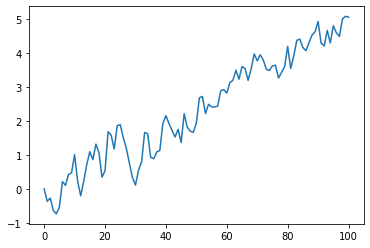

In [30]:
plot(x)

In [31]:
@nb.jit(parallel=True)
def many_sims_parallel(tot_sims = 1000, dt = 0.001, tot_steps =10000, xinit=0.0, noise_scaler=1.0, snapshot_step=100):
  x_sims=np.zeros((tot_sims, int(tot_steps/snapshot_step)+1))
  # print(shape(x_sims))
  for sim_num in nb.prange(tot_sims):
    x_sims[sim_num]=one_simulation(dt=dt, tot_steps=tot_steps, xinit=xinit, noise_scaler=noise_scaler, snapshot_step=snapshot_step)
  return x_sims

In [32]:
xs = many_sims_parallel()

In [36]:
%time many_sims_parallel()

CPU times: user 655 ms, sys: 616 µs, total: 656 ms
Wall time: 338 ms


array([[ 0.        , -0.57282861, -0.24615712, ...,  4.87794413,
         5.15986874,  5.06041027],
       [ 0.        ,  0.81086737,  1.14177194, ...,  4.97368071,
         5.09838502,  4.87518124],
       [ 0.        , -0.01477392, -0.23709533, ...,  4.97036567,
         4.96000079,  5.28404353],
       ...,
       [ 0.        ,  0.14175109,  0.00825783, ...,  4.87876621,
         4.87481281,  4.89940812],
       [ 0.        ,  0.09608166,  0.07904821, ...,  4.65866389,
         4.95280999,  4.71895593],
       [ 0.        ,  0.06173689, -0.76127398, ...,  4.88927675,
         5.25834135,  4.99138439]])

In [37]:
%time many_sims_parallel(tot_sims=100000)

CPU times: user 1min 5s, sys: 60.9 ms, total: 1min 5s
Wall time: 34.7 s


array([[ 0.        ,  0.07278839,  0.26576709, ...,  4.82909467,
         4.5361576 ,  4.82821542],
       [ 0.        , -0.18630228,  0.52952452, ...,  5.12569999,
         4.66759908,  4.91958899],
       [ 0.        , -0.2463737 , -0.05074997, ...,  4.99057347,
         5.15675075,  4.95658439],
       ...,
       [ 0.        ,  0.39252409, -0.03309495, ...,  4.83071844,
         4.68745166,  5.03173958],
       [ 0.        , -0.85709392, -0.48246504, ...,  5.47226063,
         5.54650166,  5.24014203],
       [ 0.        ,  0.32415826,  0.29638994, ...,  5.16243519,
         5.05156336,  4.81869978]])

In [38]:
%time many_sims_parallel(tot_sims=100000, snapshot_step = 1000)

CPU times: user 1min 20s, sys: 37.6 ms, total: 1min 20s
Wall time: 42.2 s


array([[ 0.        ,  0.59171517,  1.15495093, ...,  3.22509272,
         4.410719  ,  4.83800076],
       [ 0.        ,  0.49762387,  2.22491425, ...,  4.32256025,
         4.3350116 ,  5.07978413],
       [ 0.        ,  0.67561401,  0.40871963, ...,  3.21519528,
         4.48913836,  5.14997054],
       ...,
       [ 0.        ,  0.28705966,  0.32701995, ...,  4.7388114 ,
         3.97075738,  5.08965999],
       [ 0.        , -0.64324877,  1.48354928, ...,  3.95935351,
         4.51212992,  5.04983817],
       [ 0.        , -1.15133505,  0.69921913, ...,  3.82927657,
         4.00441199,  5.25289396]])

In [39]:
%time many_sims_parallel(tot_sims=100000, snapshot_step = 1000)

CPU times: user 1min 19s, sys: 26.9 ms, total: 1min 19s
Wall time: 40.5 s


array([[ 0.        , -0.26914889,  1.38460687, ...,  4.0693552 ,
         4.37067879,  5.17809226],
       [ 0.        ,  1.55566844,  1.41773623, ...,  3.75587716,
         4.49034315,  5.34534558],
       [ 0.        ,  1.01263286,  0.06715812, ...,  3.99218658,
         4.68543276,  4.70789605],
       ...,
       [ 0.        , -0.35981453,  1.46344507, ...,  3.72617104,
         4.93501836,  5.24725791],
       [ 0.        , -0.52982467,  0.39544899, ...,  3.97567992,
         4.17012133,  4.57862739],
       [ 0.        ,  0.97910357,  1.19159471, ...,  4.48016313,
         4.37714389,  4.4734598 ]])

In [40]:
xst = many_sims_parallel(tot_sims=100000, snapshot_step = 1000)

In [41]:
fig=go.Figure()
for time_index in range(1,10):
  fig.add_trace(go.Histogram(x=xst[:,time_index], histnorm='probability density'))
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
def k(t):
  return 1.0+1.0*t
def center(t):
  return 0.5*t
def f(x,t):
  return -k(t)*(x-center(t))
dt=0.001
snapshot_step=1000
for time_index in range(1,10):
  t=dt*snapshot_step*time_index
  xx=np.linspace(-3.0, 6.0,1000)
  b=np.exp(-0.5*k(t)*(xx-center(t))**2)/np.sqrt(2*np.pi/k(t))
  fig.add_trace(go.Scatter(x=xx,y=b))

In [42]:
fig.show()